## 1. Data Exploration

In [1]:
import pandas as pd

csv_input = pd.read_csv('data/files/dataset_trajectory.csv')
data = csv_input

In [2]:
data

,pos.x,pos.y,pos.z,heading,velocity,weather
0,-77.030670,-1.283448,0.294200,-1.568362,7.056001,2
1,-77.030670,-1.283448,0.061311,-1.568362,7.172558,2
2,-77.029778,-1.283539,-0.030319,-1.568443,1.053028,2
3,-77.028854,-1.283728,-0.023681,-1.568593,0.883579,2
4,-77.008575,-1.288779,0.003869,-1.572756,1.548891,2
...,...,...,...,...,...,...
932395,-225.482391,-11.600016,9.988826,-0.011426,87.899382,2
932396,-225.455750,-9.158527,9.988826,-0.008848,87.898408,2
932397,-225.434311,-6.717003,9.988826,-0.005570,87.897992,2
932398,-225.420166,-4.275458,9.988826,-0.001460,87.896323,2


In [3]:
# show head
print(data.shape)
data.head()

(932400, 6)


,pos.x,pos.y,pos.z,heading,velocity,weather
0,-77.030670,-1.283448,0.294200,-1.568362,7.056001,2
1,-77.030670,-1.283448,0.061311,-1.568362,7.172558,2
2,-77.029778,-1.283539,-0.030319,-1.568443,1.053028,2
3,-77.028854,-1.283728,-0.023681,-1.568593,0.883579,2
4,-77.008575,-1.288779,0.003869,-1.572756,1.548891,2


In [4]:
# Remove rows with any NaN values
data = data.dropna()
print(len(data))

932400


In [5]:
# show general statistics
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 932400 entries, 0 to 932399
Data columns (total 6 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   pos.x     932400 non-null  float64
 1   pos.y     932400 non-null  float64
 2   pos.z     932400 non-null  float64
 3   heading   932400 non-null  float64
 4   velocity  932400 non-null  float64
 5   weather   932400 non-null  int64  
dtypes: float64(5), int64(1)
memory usage: 42.7 MB


col:  pos.x


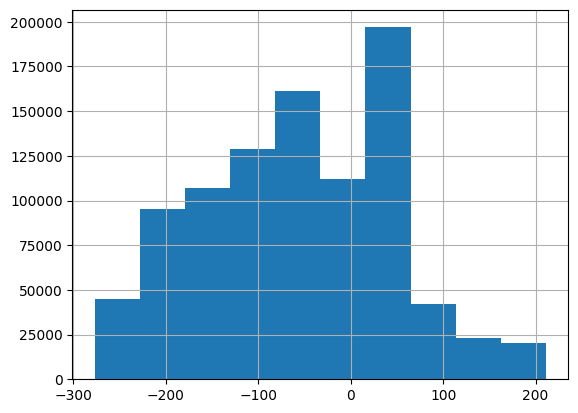

col:  pos.y


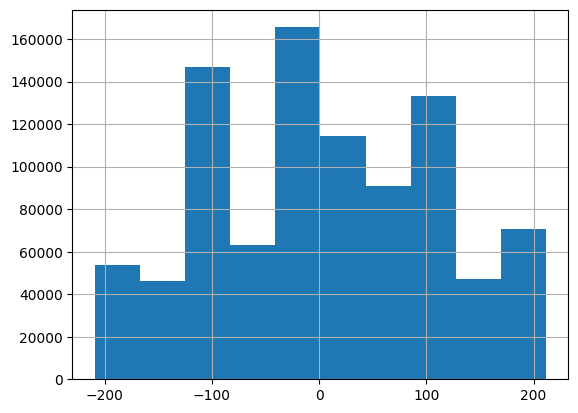

col:  pos.z


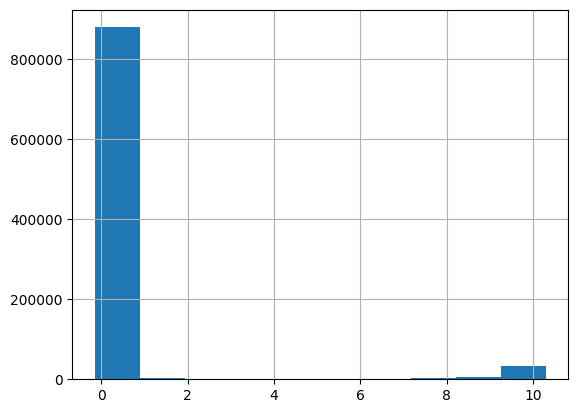

col:  heading


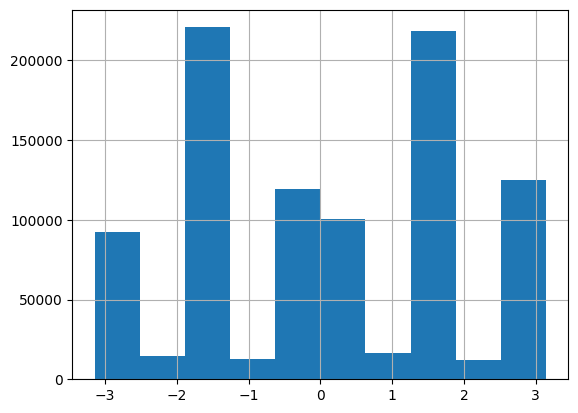

col:  velocity


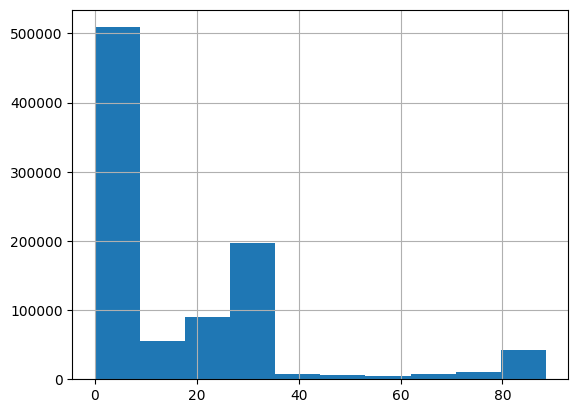

col:  weather


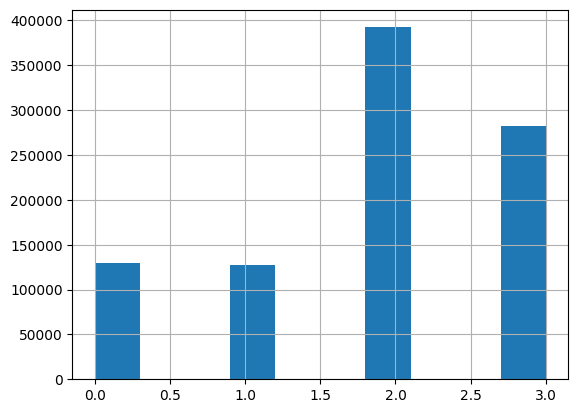

In [6]:
# Show histogram for all columns
import matplotlib.pyplot as plt
columns = data.columns
for col in columns:
    print("col: ", col)
    data[col].hist()
    plt.show()

## 2. Create windowing

In [7]:
import numpy as np

# Initialize an empty list to store the grouped time series data
grouped_data = []

# The number of rows for each group
chunk_size = 100

for start in range(0, len(data), chunk_size):
    end = start + chunk_size
    # Extract the chunk of data for this group
    chunk = data.iloc[start:end]
    # Convert the chunk to a list of lists (each sublist contains heading, posx, posy, posz)
    hxyz = chunk.values.tolist()
    # Append this chunk to the grouped_data list
    grouped_data.append(hxyz)

# Convert the list to a more suitable format if necessary
# For example, if you want it in a NumPy array for further processing:
grouped_data_np = np.array(grouped_data, dtype=object)

## Illustration
# sequences = np.array([
#    [  # First sequence
#        [0.1, 0.2, 1.0, 0.5, 0.0],  # Timestep 1: posx, posy, speed, acceleration
#        [0.2, 0.3, 1.1, 0.6, 0.0],  # Timestep 2
#        [0.3, 0.4, 1.2, 0.7, 0.0],  # Timestep 3
#        [0.4, 0.5, 1.3, 0.8, 0.0],  # Timestep 4
#        [0.5, 0.6, 1.4, 0.9, 0.0]   # Timestep 5
#
#             .....
#        [0.7, 0.6, 2.4, 1.9, 0.0]   # Timestep 100
#    ],
#    [  # Second sequence
#        [0.6, 0.7, 1.5, 1.0, 0.0],  # Timestep 1
#        [0.7, 0.8, 1.6, 1.1, 0.0],  # Timestep 2
#        [0.8, 0.9, 1.7, 1.2, 0.0],  # Timestep 3
#        [0.9, 1.0, 1.8, 1.3, 0.0],  # Timestep 4
#        [1.0, 1.1, 1.9, 1.4, 0.0]   # Timestep 5
#
#             .....
#        [0.7, 0.6, 2.4, 1.9, 0.0]   # Timestep 100
#    ]
#])

In [8]:
grouped_data

[[[-77.03067016601562,
   -1.2834484577178955,
   0.2941999733448028,
   -1.568362197558564,
   7.056000995635986,
   2.0],
  [-77.03067016601562,
   -1.2834484577178955,
   0.0613106526434421,
   -1.568362197558564,
   7.172557783126832,
   2.0],
  [-77.02977752685547,
   -1.2835389375686646,
   -0.0303188320249319,
   -1.5684426252836317,
   1.0530278386139669,
   2.0],
  [-77.02885437011719,
   -1.2837284803390503,
   -0.0236808769404888,
   -1.5685933599412598,
   0.8835790393816798,
   2.0],
  [-77.00857543945312,
   -1.2887792587280271,
   0.0038687132764607,
   -1.5727560098386153,
   1.5488912299895972,
   2.0],
  [-76.95860290527344,
   -1.3004887104034424,
   0.0255959313362836,
   -1.58088095609,
   2.4778409041017726,
   2.0],
  [-76.87789154052734,
   -1.3185633420944214,
   0.0373880378901958,
   -1.5937161933774326,
   3.679502171850321,
   2.0],
  [-76.76583862304688,
   -1.3436343669891355,
   0.0421668626368045,
   -1.6099569060443528,
   4.698247320394622,
   2.0],
 

In [9]:
grouped_data[0]

[[-77.03067016601562,
  -1.2834484577178955,
  0.2941999733448028,
  -1.568362197558564,
  7.056000995635986,
  2.0],
 [-77.03067016601562,
  -1.2834484577178955,
  0.0613106526434421,
  -1.568362197558564,
  7.172557783126832,
  2.0],
 [-77.02977752685547,
  -1.2835389375686646,
  -0.0303188320249319,
  -1.5684426252836317,
  1.0530278386139669,
  2.0],
 [-77.02885437011719,
  -1.2837284803390503,
  -0.0236808769404888,
  -1.5685933599412598,
  0.8835790393816798,
  2.0],
 [-77.00857543945312,
  -1.2887792587280271,
  0.0038687132764607,
  -1.5727560098386153,
  1.5488912299895972,
  2.0],
 [-76.95860290527344,
  -1.3004887104034424,
  0.0255959313362836,
  -1.58088095609,
  2.4778409041017726,
  2.0],
 [-76.87789154052734,
  -1.3185633420944214,
  0.0373880378901958,
  -1.5937161933774326,
  3.679502171850321,
  2.0],
 [-76.76583862304688,
  -1.3436343669891355,
  0.0421668626368045,
  -1.6099569060443528,
  4.698247320394622,
  2.0],
 [-76.62176513671875,
  -1.3764687776565552,
  0.

In [10]:
print(len(grouped_data))
print(len(grouped_data[0]))
print(len(grouped_data[0][0]))

9324
100
6


In [11]:
print(len(grouped_data))
print(len(grouped_data[9323]))
print(len(grouped_data[9323][0]))

9324
100
6


In [12]:
type(grouped_data)

list

## 3. Model Configuration

In [13]:
import torch
from torch.utils.data import DataLoader
from model import TransformerWithPE
from utils import (load_and_partition_data, make_datasets, move_to_device,
                   split_sequence, visualize)

BS = 512
FEATURE_DIM = 128
NUM_HEADS = 8
NUM_EPOCHS = 250
NUM_VIS_EXAMPLES = 10
NUM_LAYERS = 2
LR = 0.001

In [14]:

# Converting data into ndarray
data = np.array(grouped_data)

In [ ]:

data

In [15]:
num_features = data.shape[2]
num_features

6

In [17]:
type(data)

numpy.ndarray

In [16]:
train_set, test_set = make_datasets(data)

In [ ]:
train_loader, test_loader = DataLoader(
        train_set, batch_size=BS, shuffle=True
    ), DataLoader(test_set, batch_size=BS, shuffle=False)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## 4. Initialize the model

In [ ]:
# Initialize model, optimizer and loss criterion
model = TransformerWithPE(
    num_features, num_features, FEATURE_DIM, NUM_HEADS, NUM_LAYERS
).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=LR)
criterion = torch.nn.MSELoss()

## 5. Train the model

In [ ]:
 # Train loop
for epoch in range(NUM_EPOCHS):
    epoch_loss = 0.0
    for batch in train_loader:
        optimizer.zero_grad()

        src, tgt, tgt_y = split_sequence(batch[0])
        src, tgt, tgt_y = move_to_device(device, src, tgt, tgt_y)
        src.device
        tgt.device
        # [bs, tgt_seq_len, num_features]
        pred = model(src, tgt)
        loss = criterion(pred[:, :, :2], tgt_y[:, :, :2])
        epoch_loss += loss.item()

        loss.backward()
        optimizer.step()

    print(
        f"Epoch [{epoch + 1}/{NUM_EPOCHS}], Loss: "
        f"{(epoch_loss / len(train_loader)):.4f}"
    )

In [ ]:
# Save the trained model
torch.save(model.state_dict(), 'trained_model/model_state_dict_3.pth')

## 6. Evaluate the model

In [ ]:
import matplotlib.pyplot as plt
#If you want to do it in town11 use:
#center = (390, 700)
#x_scale = 1/25
#y_scale = -1/25

def calculatePosition(x,y):
    center = (390, 330)
    #center = (390, 700)
    x_scale = 1.25
    y_scale = -1.25
    return ((x*x_scale+center[0]), (y*y_scale+center[1]))

def plot_pred(observed, future, predicted):
    img = plt.imread("data/assets/Town05_0.5sqk.jpg")

    #img = plt.imread("data/assets/Town11_400sqk.png")

    fig, ax = plt.subplots()
    ax.imshow(img)

    xs = []
    ys = []
    fxs = []
    fys = []
    pxs = []
    pys = []
    
    for v in observed:
        (x,y) = calculatePosition(v[0], v[1])
        xs.append(x)
        ys.append(y)

    for v in future[:len(predicted)]:
        (x,y) = calculatePosition(v[0], v[1])
        fxs.append(x)
        fys.append(y)
    
    for v in predicted:
        (x,y) = calculatePosition(v[0], v[1])
        pxs.append(x)
        pys.append(y)

    plt.scatter(fxs, fys, color="orange", zorder=1)
    plt.scatter(pxs, pys, color="red", zorder=3)
    plt.scatter(xs, ys, color="blue", zorder=2)
    plt.legend(['ActualFuture', 'PredictedFuture', 'Input'])
    plt.show()

def plot(observed):
    img = plt.imread("assets/Town05_0.5sqk.jpg")

    #img = plt.imread("assets/Town11_400sqk.png")

    fig, ax = plt.subplots()
    ax.imshow(img)

    xs = []
    ys = []
    
    for v in observed:
        (x,y) = calculatePosition(v[0], v[1])
        xs.append(x)
        ys.append(y)
    
    marker_on = [xs[0], xs[len(xs)-1]]

    plt.scatter(xs, ys, color="blue", zorder=2)
    plt.legend(['ActualFuture'])
    plt.show()

In [ ]:
# Evaluate model
from utils import visualize_best_prediction, visualize_multi, visualize_multi_posx_posy


model.eval()
eval_loss = 0.0
infer_loss = 0.0

# Variables to track the best prediction
best_loss = float('inf')
best_src = None
best_tgt = None
best_pred = None

with torch.no_grad():
    for idx, batch in enumerate(test_loader):
        src, tgt, tgt_y = split_sequence(batch[0])
        src, tgt, tgt_y = move_to_device(device, src, tgt, tgt_y)

        # [bs, tgt_seq_len, num_features]
        pred = model(src, tgt)
        loss = criterion(pred[:, :, :2], tgt_y[:, :, :2])
        eval_loss += loss.item()

        # Update best prediction if current prediction is better
        if loss.item() < best_loss:
            best_loss = loss.item()
            best_src = src
            best_tgt = tgt
            best_pred = pred

        # Run inference with model
        pred_infer = model.infer(src, tgt.shape[1])
        loss_infer = criterion(pred_infer[:, :, :2], tgt_y[:, :, :2])
        infer_loss += loss_infer.item()

        # Visualize some few predictions
        if idx < NUM_VIS_EXAMPLES:
            print("Feature prediction")
            visualize_multi_posx_posy(src, tgt, pred, pred_infer, idx)
            print("Trajectory prediction")
            visualize_multi(src[:, :, :2], tgt[:, :, :2], pred[:, :, :2], pred_infer[:, :, :2], idx)

print("Viualizing the best prediction")

# After finding the best prediction, visualize it
if best_src is not None and best_tgt is not None and best_pred is not None:
    # Assuming visualize_multi is adapted for 2D positions visualization
    # This visualization will now only show the best prediction example
    visualize_best_prediction(best_src[:, :, :2], best_tgt[:, :, :2], best_pred[:, :, :2], idx=0)  # idx=0, assuming you're interested in the first example
    print("On the map")
print(len(best_src[:, :, :2]))
avg_eval_loss = eval_loss / len(test_loader)
avg_infer_loss = infer_loss / len(test_loader)

print(f"Eval / Infer Loss on test set: {avg_eval_loss:.4f} / {avg_infer_loss:.4f}")

## 7. Some metrics

In [ ]:
# Assume test_loader, model, device, criterion are defined

from utils import calculate_metrics


model.eval()
metrics_sum = {'RMSE': 0, 'MAE': 0, 'MAPE': 0}
n_batches = 0

with torch.no_grad():
    for batch in test_loader:
        src, tgt, tgt_y = split_sequence(batch[0])
        src, tgt, tgt_y = move_to_device(device, src, tgt, tgt_y)

        pred = model(src, tgt).cpu().numpy()
        tgt_y = tgt_y.cpu().numpy()  # Convert to numpy for metric calculation

        batch_metrics = calculate_metrics(tgt_y[:, :, :2], pred[:, :, :2])
        
        # Aggregate metrics
        #for key in metrics_sum.keys():
        #    metrics_sum[key] += batch_metrics[key]
        
        #n_batches += 1

# Compute average metrics


In [ ]:
print(len(best_src))

In [ ]:
best_src[:, :, :2][0]

In [ ]:
print(len(best_src[:, :, :2][0]))

In [ ]:
best_pred[:, :, :2][0]

In [ ]:
print(len(best_pred[:, :, :2][0]))

In [ ]:
best_pred[:, :, :][0]

In [ ]:
for item in range(0, len(best_src)):
    plot_pred(best_src[:, :, :2][item], best_tgt[:, :, :2][item], best_pred[:, :, :2][item])

In [ ]:
# saving the prediction
np.savez('trained_model/pred_model_pred_3/model_predictions.npz', src=best_src.numpy(), tgt=best_tgt.numpy(), pred=best_pred.numpy(), loss=best_loss)

In [19]:
# loading prediction
import numpy as np
data_path = "trained_model/pred_model_pred_3/model_predictions.npz"
data_prediction = np.load(data_path)
num_features_pred = len(data_prediction.keys())

In [20]:
data_prediction["src"]

array([[[-4.78062477e+01, -1.10684578e+02,  1.96806490e-01,
         -7.01893419e-02,  1.68278939e-06,  1.00000000e+00],
        [-4.78062477e+01, -1.10684578e+02,  1.96806490e-01,
         -7.01893419e-02,  2.37275731e-06,  1.00000000e+00],
        [-4.78062477e+01, -1.10684578e+02,  1.96806490e-01,
         -7.01893419e-02,  2.74707247e-07,  1.00000000e+00],
        ...,
        [-4.73703346e+01, -8.18645096e+01,  1.92930713e-01,
         -6.75007375e-03,  2.89752407e+01,  1.00000000e+00],
        [-4.73648682e+01, -8.10574265e+01,  1.94215357e-01,
         -6.75352337e-03,  2.90896759e+01,  1.00000000e+00],
        [-4.73594017e+01, -8.02476730e+01,  1.95424452e-01,
         -6.75497949e-03,  2.91602135e+01,  1.00000000e+00]],

       [[ 2.44629383e+01,  1.72441635e+01,  6.74141273e-02,
          3.13028073e+00,  4.48207203e-07,  3.00000000e+00],
        [ 2.44629383e+01,  1.72441635e+01,  6.74141273e-02,
          3.13028073e+00,  7.91168134e-07,  3.00000000e+00],
        [ 2.44629

In [ ]:
best_src

In [ ]:
data_prediction["tgt"]

In [ ]:
best_tgt

In [ ]:
data_prediction["pred"]

In [ ]:
best_pred

## 8. Extern Evaluation

In [ ]:
from model import TransformerWithPE
num_features = 6
model = TransformerWithPE(
    num_features, num_features, FEATURE_DIM, NUM_HEADS, NUM_LAYERS
)
model.load_state_dict(torch.load("trained_model/model_state_dict_2.pth"))

In [18]:
csv_evaluation = pd.read_csv('data/files/evaluation_trajectory_09mars24.csv')
data_evaluation = csv_evaluation
data_evaluation

,pos.x,pos.y,pos.z,heading,velocity,weather
0,-184.810776,-16.894972,0.349650,0.000276,7.056001,2
1,-184.810776,-16.894972,0.102828,0.000276,9.476255,2
2,-184.810638,-16.893084,-0.005079,0.000173,1.096180,2
3,-184.810516,-16.892187,-0.001560,0.000094,0.676115,2
4,-184.809372,-16.881786,0.018010,-0.000684,0.952583,2
...,...,...,...,...,...,...
1795,-98.534698,-144.216080,0.050441,1.572167,19.547256,2
1796,-99.072975,-144.216309,0.050440,1.571787,19.276842,2
1797,-99.603806,-144.216461,0.050440,1.571516,19.009980,2
1798,-100.128716,-144.216568,0.050435,1.571329,18.893541,2


In [ ]:
#observed = data_evaluation.to_numpy()
#observed

%load_ext autoreload
%autoreload 2

In [21]:
data_prediction["src"][0]

array([[-4.78062477e+01, -1.10684578e+02,  1.96806490e-01,
        -7.01893419e-02,  1.68278939e-06,  1.00000000e+00],
       [-4.78062477e+01, -1.10684578e+02,  1.96806490e-01,
        -7.01893419e-02,  2.37275731e-06,  1.00000000e+00],
       [-4.78062477e+01, -1.10684578e+02,  1.96806490e-01,
        -7.01893419e-02,  2.74707247e-07,  1.00000000e+00],
       [-4.78062477e+01, -1.10684578e+02,  1.96806490e-01,
        -7.01893419e-02,  1.03045818e-06,  1.00000000e+00],
       [-4.78062477e+01, -1.10684578e+02,  1.96806490e-01,
        -7.01893419e-02,  1.78589016e-06,  1.00000000e+00],
       [-4.78062477e+01, -1.10684578e+02,  1.96806490e-01,
        -7.01893419e-02,  2.54433712e-06,  1.00000000e+00],
       [-4.78062477e+01, -1.10684578e+02,  1.96806490e-01,
        -7.01893419e-02,  6.86889621e-08,  1.00000000e+00],
       [-4.78062477e+01, -1.10684578e+02,  1.96806490e-01,
        -7.01893419e-02,  8.24181825e-07,  1.00000000e+00],
       [-4.78062477e+01, -1.10684578e+02,  1.968

In [22]:
print(len(data_prediction["src"][0]))

80


In [23]:
print(len(data_prediction["pred"][0]))

20


In [ ]:
from torch import tensor
import imt
import keras.backend as K

def predict_fn(x):
    y = model.infer(tensor([x]), 20)
    return y[0].detach().numpy()

def rmse(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

explainer = imt.IMT(predict_fn, rmse, data_prediction["src"][0], data_prediction["pred"][0], ["pos.x", "pos.y", "pos.z", "heading", "velocity", "weather"])

In [ ]:
explainer.avg_feature_importance(data_prediction["src"][0])
explainer.timestep_importance(data_prediction["src"][0])
explainer.windowed_feature_importance(data_prediction["src"][0], 10, 2)
explainer.feature_importance(data_prediction["src"][0])
explainer.output_input_importance(data_prediction["src"][0])

In [ ]:
train_set, test_set = make_datasets(data)
train_loader, test_loader = DataLoader(
        train_set, batch_size=BS, shuffle=True
    ), DataLoader(test_set, batch_size=BS, shuffle=False)

In [ ]:
# Initialize model, optimizer and loss criterion
model = TransformerWithPE(
    num_features, num_features, FEATURE_DIM, NUM_HEADS, NUM_LAYERS
).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=LR)
criterion = torch.nn.MSELoss()

In [ ]:
# Evaluate model
from utils import visualize_best_prediction, visualize_multi, visualize_multi_posx_posy


model.eval()
eval_loss = 0.0
infer_loss = 0.0

# Variables to track the best prediction
best_loss = float('inf')
best_src = None
best_tgt = None
best_pred = None

with torch.no_grad():
    for idx, batch in enumerate(test_loader):
        src, tgt, tgt_y = split_sequence(batch[0])
        src, tgt, tgt_y = move_to_device(device, src, tgt, tgt_y)

        # [bs, tgt_seq_len, num_features]
        pred = model(src, tgt)
        loss = criterion(pred[:, :, :2], tgt_y[:, :, :2])
        eval_loss += loss.item()

        # Update best prediction if current prediction is better
        if loss.item() < best_loss:
            best_loss = loss.item()
            best_src = src
            best_tgt = tgt
            best_pred = pred

        # Run inference with model
        pred_infer = model.infer(src, tgt.shape[1])
        loss_infer = criterion(pred_infer[:, :, :2], tgt_y[:, :, :2])
        infer_loss += loss_infer.item()

        # Visualize some few predictions
        if idx < NUM_VIS_EXAMPLES:
            print("Feature prediction")
            visualize_multi_posx_posy(src, tgt, pred, pred_infer, idx)
            print("Trajectory prediction")
            visualize_multi(src[:, :, :2], tgt[:, :, :2], pred[:, :, :2], pred_infer[:, :, :2], idx)

print("Viualizing the best prediction")

# After finding the best prediction, visualize it
if best_src is not None and best_tgt is not None and best_pred is not None:
    # Assuming visualize_multi is adapted for 2D positions visualization
    # This visualization will now only show the best prediction example
    visualize_best_prediction(best_src[:, :, :2], best_tgt[:, :, :2], best_pred[:, :, :2], idx=0)  # idx=0, assuming you're interested in the first example
    print("On the map")
print(len(best_src[:, :, :2]))
avg_eval_loss = eval_loss / len(test_loader)
avg_infer_loss = infer_loss / len(test_loader)

print(f"Eval / Infer Loss on test set: {avg_eval_loss:.4f} / {avg_infer_loss:.4f}")

## Feature Imortance

### 1. Linear model insppection

In [ ]:
from sklearn.metrics import classification_report

# Classification 